In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
df = pd.read_csv(r'../Data/universities.csv')
df.head(5)

,Institution Name,Region,Country,Overall,Academic Reputation,Employer Reputation,Faculty Student Ratio,Citations Per Faculty,International Faculty Ratio,International Students Ratio,International Research Network,Employment Outcomes,Sustainability
0,Massachusetts Institute of Technology (MIT),North America,United States,100.0,100.0,100.0,100.0,100.0,100.0,88.2,94.3,100.0,95.2
1,University of Cambridge,Europe,United Kingdom,99.2,100.0,100.0,100.0,92.3,100.0,95.8,99.9,100.0,97.3
2,University of Oxford,Europe,United Kingdom,98.9,100.0,100.0,100.0,90.6,98.2,98.2,100.0,100.0,97.8
3,Harvard University,North America,United States,98.3,100.0,100.0,98.3,100.0,84.6,66.8,100.0,100.0,96.7
4,Stanford University,North America,United States,98.1,100.0,100.0,100.0,99.9,99.9,51.2,95.8,100.0,94.4


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Institution Name                1200 non-null   object 
 1   Region                          1200 non-null   object 
 2   Country                         1200 non-null   object 
 3   Overall                         602 non-null    float64
 4   Academic Reputation             1200 non-null   float64
 5   Employer Reputation             1200 non-null   float64
 6   Faculty Student Ratio           1199 non-null   float64
 7   Citations Per Faculty           1200 non-null   float64
 8   International Faculty Ratio     1143 non-null   float64
 9   International Students Ratio    1175 non-null   float64
 10  International Research Network  1197 non-null   float64
 11  Employment Outcomes             1199 non-null   float64
 12  Sustainability                  11

In [4]:
for column in df.columns:
    if column != 'Institution Name' and \
        column != 'Region' and \
        column != 'Country' and \
        column != 'Overall':
        median = df[column].median()
        df[column].fillna(median,inplace=True)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Institution Name                1200 non-null   object 
 1   Region                          1200 non-null   object 
 2   Country                         1200 non-null   object 
 3   Overall                         602 non-null    float64
 4   Academic Reputation             1200 non-null   float64
 5   Employer Reputation             1200 non-null   float64
 6   Faculty Student Ratio           1200 non-null   float64
 7   Citations Per Faculty           1200 non-null   float64
 8   International Faculty Ratio     1200 non-null   float64
 9   International Students Ratio    1200 non-null   float64
 10  International Research Network  1200 non-null   float64
 11  Employment Outcomes             1200 non-null   float64
 12  Sustainability                  12

# Khám phá dữ liệu

### Câu hỏi: Tìm kiếm các yếu tố ảnh hưởng tới Đầu ra việc làm của sinh viên?
- Lợi ích: Giúp sinh viên có thể chọn được trường đem lại Đầu ra việc làm cao nhất trong khả năng của mình.
- Để tìm ra câu trả lời, ta vẽ biểu đồ xem xét quan hệ của các cột dữ liệu hiện có trong bảng và cột Đầu ra việc làm. Nếu các điểm biểu diễn quan hệ tạo thành một hình dạng đường nào đó thì có thể cột đó có quan hệ với cột Đầu ra việc làm. 

In [5]:

# Hàm xử lý nhiễu trong trường hợp cần thiết
def binning_method(df: pd.DataFrame, column):
    """ 
    Parameter:
        + df: dataframe.
        + column: name of column contains noise.
    """
    number_of_rows = df.shape[0]
    number_of_bin = 5
    rows_per_bin = int(number_of_rows / number_of_bin)

    bins = np.zeros((number_of_bin,rows_per_bin)) 

    if column != 'Institution Name' and \
        column != 'Region' and \
        column != 'Country' and \
        column != 'Overall':

        data = df[[column]].sort_values(by=column,ascending=True).values

        for i in range(0,number_of_rows,rows_per_bin):
            k = int(i/rows_per_bin)
            median = int((i + i + rows_per_bin - 1) / 2)
            for j in range(rows_per_bin):
                bins[k,j] = data[median]

        for i in range(len(data)):
            for j in range(number_of_rows):
                if df[column][j] == data[i]:
                    df.at[j,column] = bins[int(i/rows_per_bin),i%rows_per_bin]

    
    return df


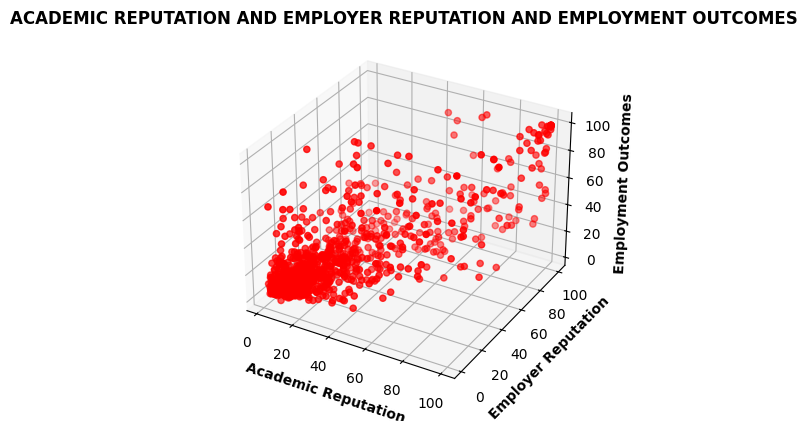

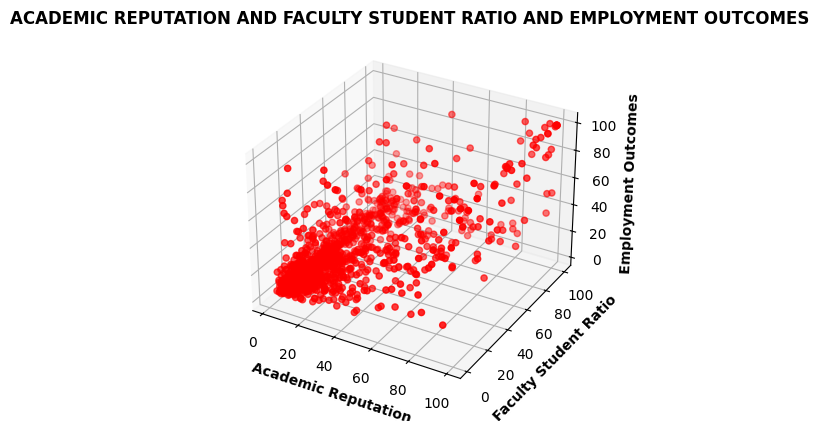

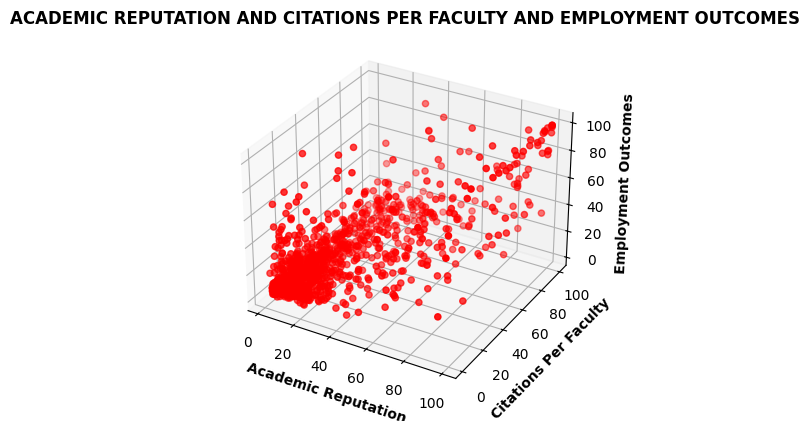

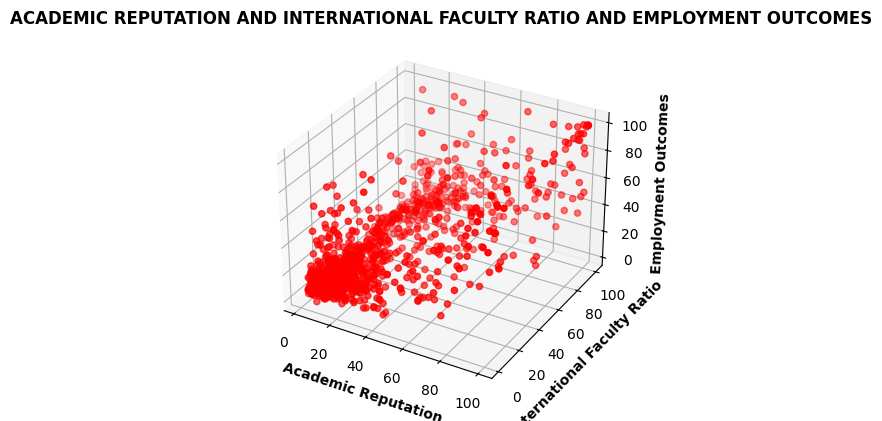

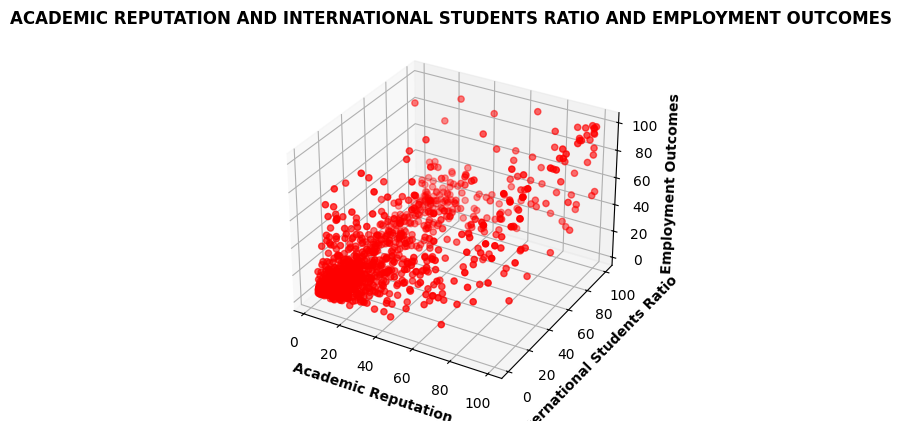

...

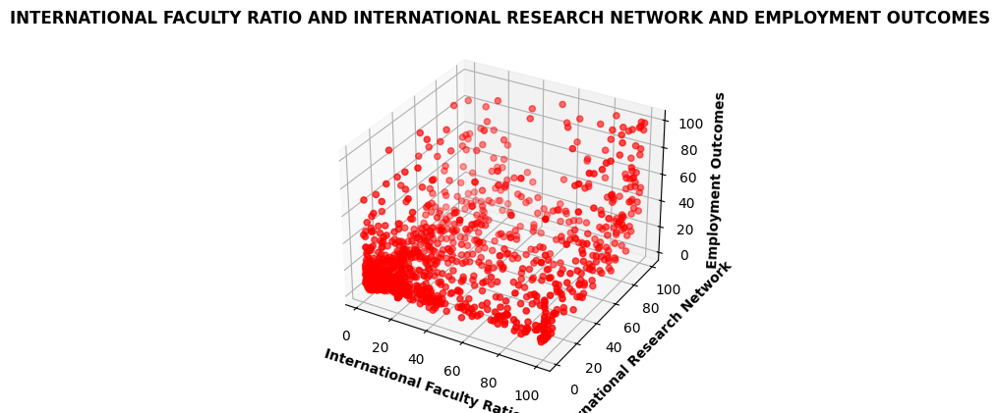

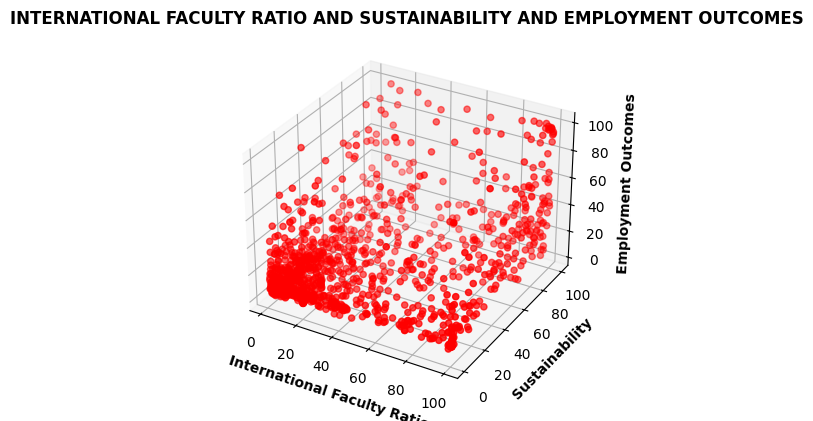

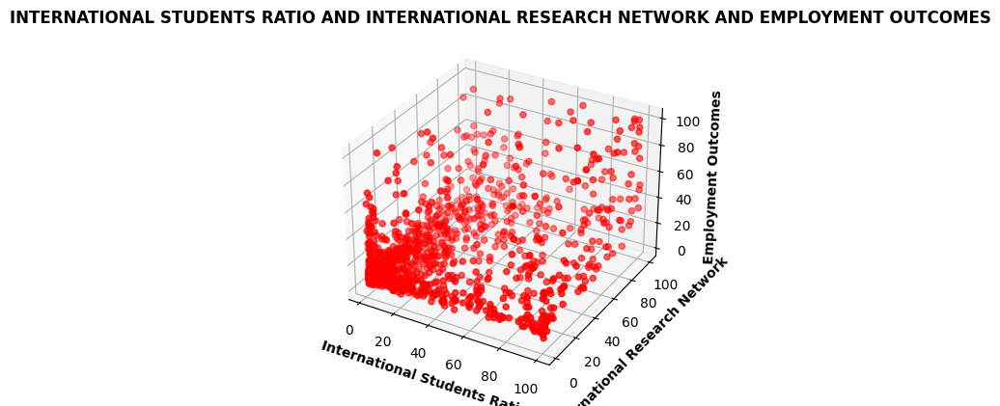

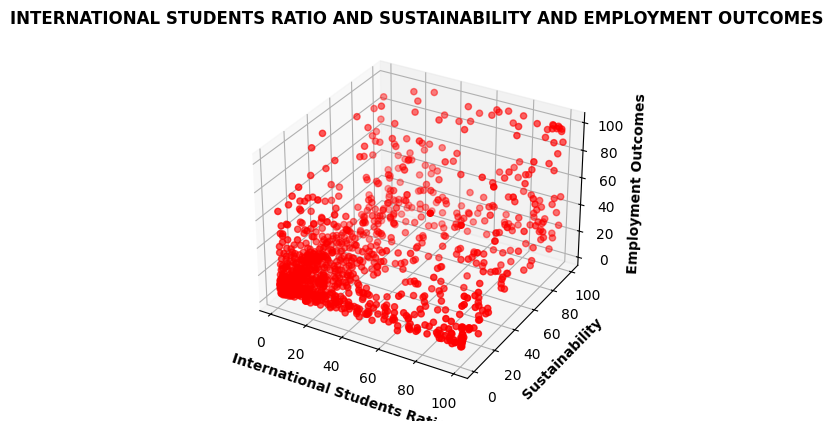

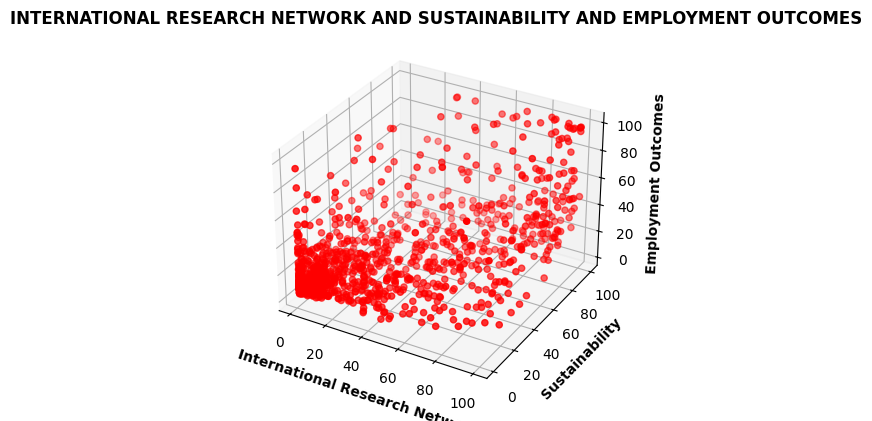

In [12]:
def draw_scatter_plot(X,Y,xlabel,ylabel,title,label):
    slope, intercept = np.polyfit(X, Y, 1)
    line = slope * X + intercept
    plt.figure(figsize=(8, 6))
    plt.scatter(X, Y, label=label)
    plt.plot(X, line, color='red', label='Regression Line')
    plt.xlabel(xlabel=xlabel,fontweight='bold')
    plt.ylabel(ylabel=ylabel,fontweight='bold')
    plt.title(label=title,fontweight='bold')
    plt.legend()
    plt.show()

def draw_scatter_plot_3D(X,Y,Z,xlable,ylable,zlabel,title,label):
    fig = plt.figure()
    ax = fig.add_subplot(111,projection='3d')
    ax.scatter(X,Y,Z,c='r',marker='o')
    ax.set_xlabel(xlabel= xlable,fontweight='bold')
    ax.set_ylabel(ylabel=ylable,fontweight='bold')
    ax.set_zlabel(zlabel=zlabel,fontweight='bold')
    ax.set_title(label=title,fontweight='bold')
    plt.show()


def draw_scatter_plot_for_all_columns(df: pd.DataFrame,column_name: str):
    for column in df.columns:
        if column != 'Institution Name' and \
        column != 'Region' and \
        column != 'Country' and \
        column != 'Overall' and \
        column != column_name:
            title = f"{column.upper()} AND {column_name.upper()}"
            draw_scatter_plot(df[column],df[column_name],column,column_name,title,title)

def draw_scatter_plot_3D_for_all_columns(df: pd.DataFrame, column_name: str):
    columns = df.columns
    n = len(columns)

    for i in range(4,n):
        if columns[i] != column_name:
            for j in range(i+1,n):
                if columns[j] != column_name:
                    title = f"{columns[i].upper()} AND {columns[j].upper()} AND {column_name.upper()}"
                    draw_scatter_plot_3D(df[columns[i]],df[columns[j]],df[column_name],columns[i],columns[j],column_name,title,title)

draw_scatter_plot_for_all_columns(df,'Employment Outcomes')
draw_scatter_plot_3D_for_all_columns(df,'Employment Outcomes')

### Trả lời:
- Ở các biểu đồ thể hiện quan hệ giữa ba thuộc tính Danh tiếng học thuật, Danh tiếng từ doanh nghiệp và Đầu ra việc làm, chúng ta đều thấy rằng mật độ các điểm ở gốc toạ độ luôn là rất dày đặc. Từ đó có thể đưa ra một dự đoán rằng, các sinh viên học tại trường ít danh tiếng thường ít đạt thành công trong đầu ra công việc.
- Mặt khác ở càng xa gốc toạ độ, ta thấy các điểm càng phân tán và chỉ tập trung tại điểm có toạ độ (100,100,100). Do vậy có thể đưa ra một dự đoán rằng, sinh viên học tại trường có càng nhiều danh tiếng về học thuật cũng như danh tiếng từ doanh nghiệp thì càng thành công về đầu ra công việc.
- Vậy có cơ sở để tin rằng, học trường càng danh tiếng thì càng có cơ hội thành công về đầu ra công việc. 

### Câu hỏi: Xem xét các yếu tố ảnh hưởng đến Tỷ lệ học sinh quốc tế theo học tại trường?
- Lợi ích: Xác định được các yếu tố ảnh hưởng đến Tỷ lệ học sinh quốc tế ở 1200 trường top đầu, các trường trong nhóm này có thể điều chỉnh một số hoạt động để thu hút sinh viên thuộc nhóm này.
- Để tìm câu trả lời cho câu hỏi trên, ta cần vẽ biểu đồ và quan sát xem các điểm biểu diễn các quan hệ có định hình nên một dạng đường gì đặc biệt hay không. Nếu có thì ta có thể dự đoán rằng, các cột khác trên biểu đồ đó có ảnh hưởng đến Tỷ lệ học sinh quốc tế theo học tại trường.

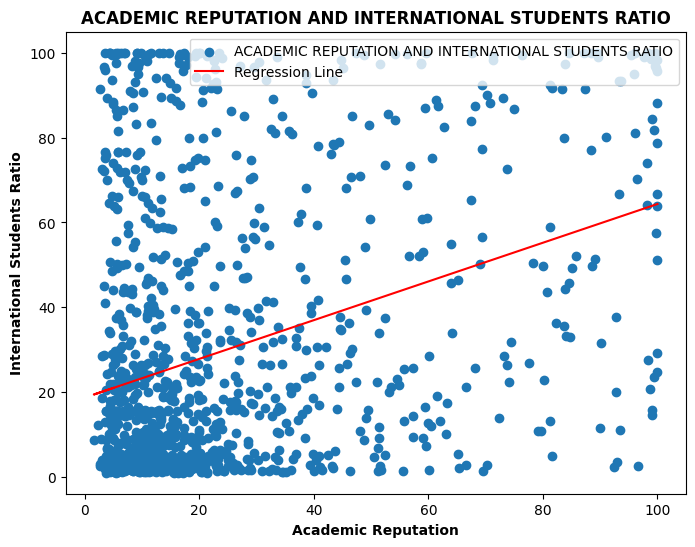

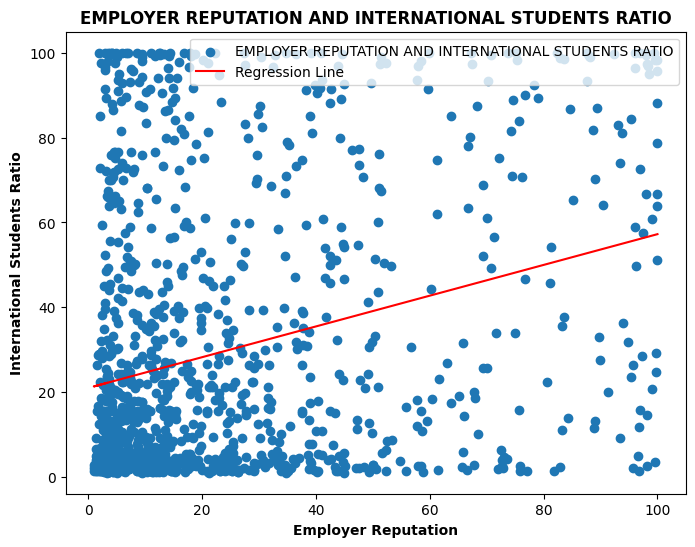

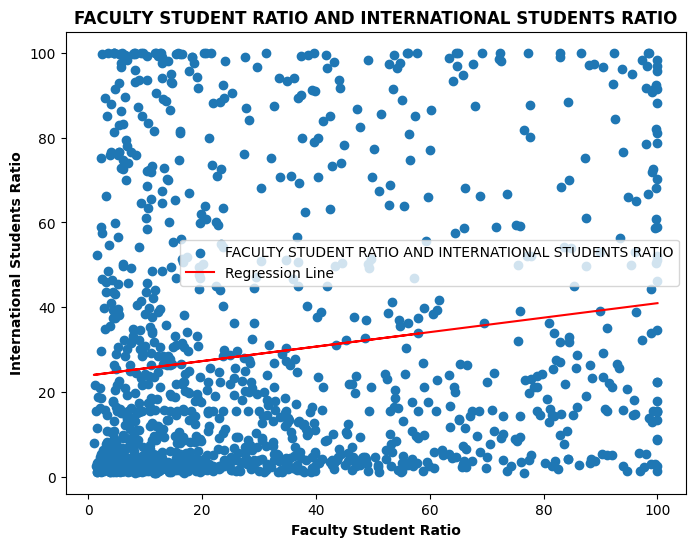

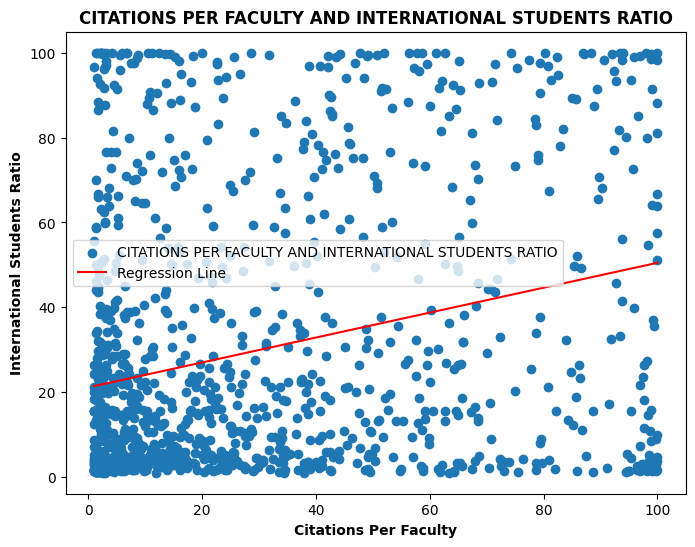

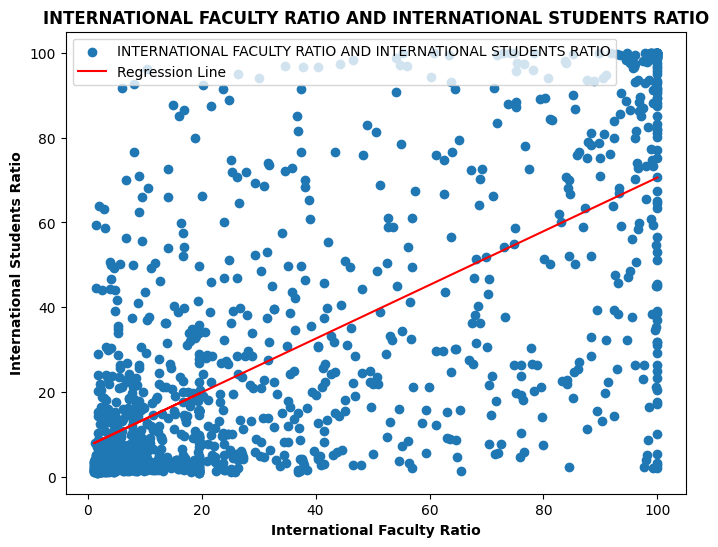

...

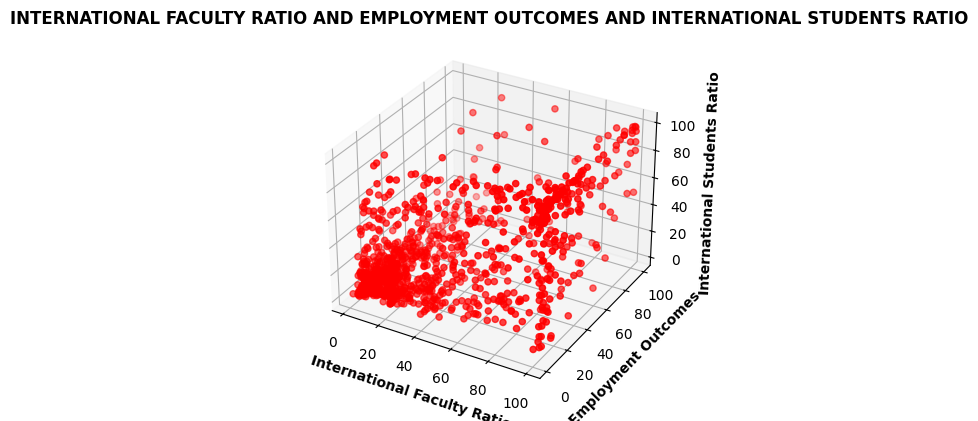

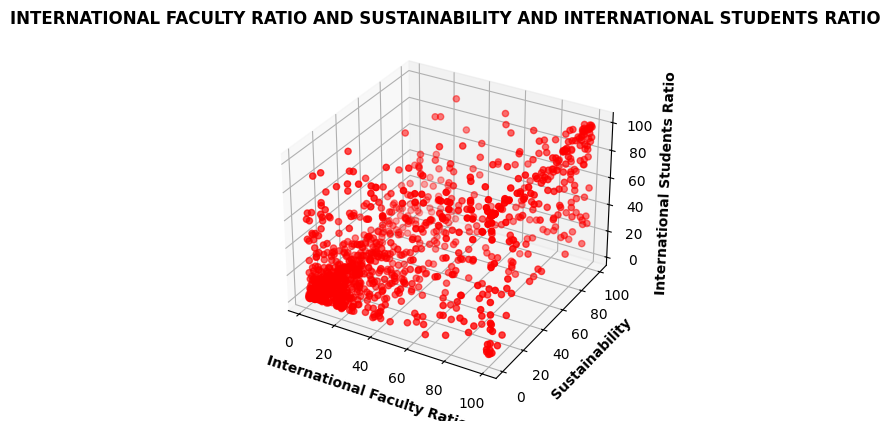

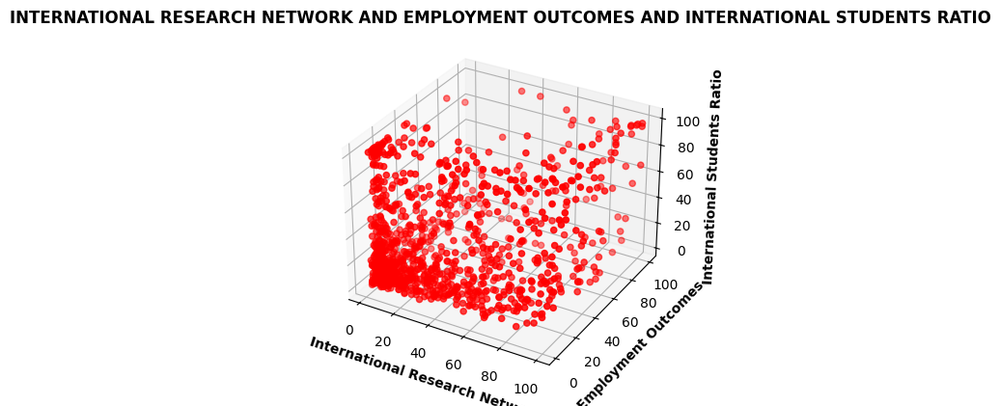

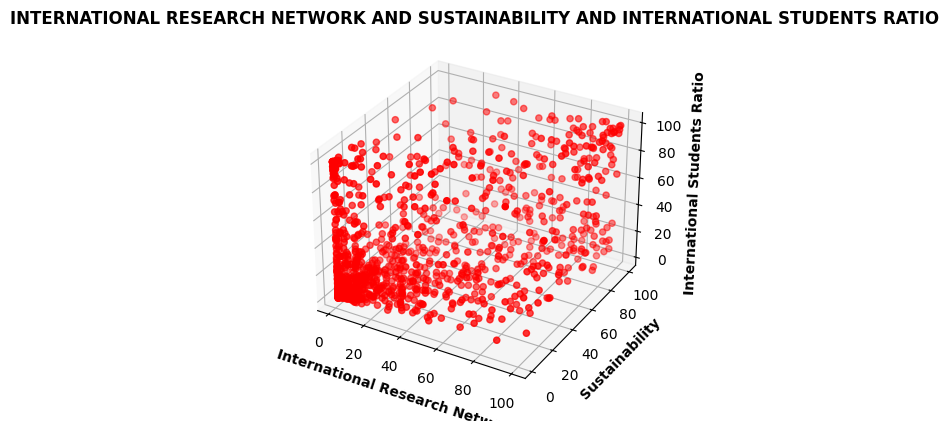

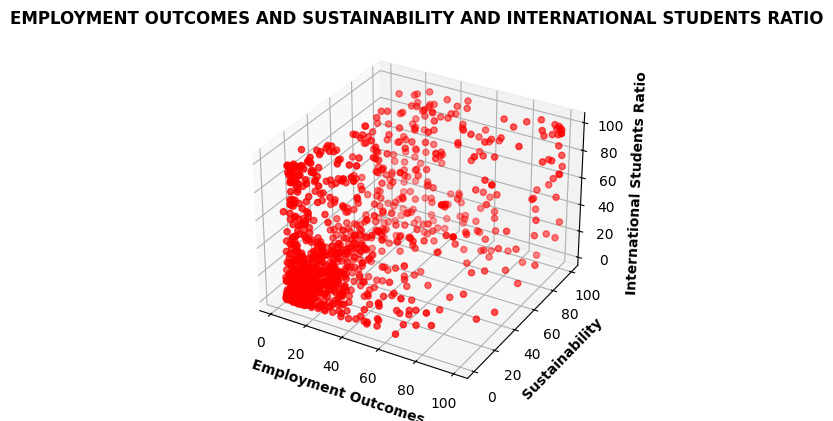

In [7]:
draw_scatter_plot_for_all_columns(df,'International Students Ratio')
draw_scatter_plot_3D_for_all_columns(df,'International Students Ratio')

### Trả lời:
- Trong hai biểu đồ thể hiện quan hệ Tỉ lệ giảng viên quốc tế, Mạng lưới nghiên cứu quốc tế, Tỉ lệ sinh viên quốc tế và Tỉ lệ giảng viên quốc tế, Mức độ cam kết, Tỉ lệ sinh viên quốc tế, ta thấy rằng các điểm biểu diễn mối quan hệ giữa 3 thuộc tính ở bên trong hình lập phương định ra một dạng đường nào đó. Do đó ta có thể suy đoán rằng, Tỉ lệ sinh viên quốc tế có thể chịu ảnh hưởng bởi các yếu tố này.